# ThreeGravitationalOrbit

We consider energy plots and orbital solutions in polar coordinates for the general potential energy


In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

In [10]:
# Change the common font size
font_size = 14
plt.rcParams.update({'font.size': font_size})

## GravitationalOrbits class and utility functions

In [11]:
class GravitationalOrbits():
    """
    This class implements the parameters and Lagrange's equations for
    two particles orbiting under gravitational attraction.
    
    Parameters
    ----------
    m_1 : float
    m_2 : float
    m_3 : float
    G : float
    
    Methods
    -------
    dz_dt(t, z)
        Returns the right side of the differential equation in vector z,
        given time t and the corresponding value of z.
    """
    
    def __init__(self, m_1=1., m_2=1., m_3=1., G=1):
        self.m_1 = m_1
        self.m_2 = m_2
        self.m_3 = m_3
        self.G = G
    
    def dz_dt(self, t, z):
        """
        This function returns the right-hand side of the diffeq: 
        [dz/dt d^2z/dt^2]
        
        Parameters
        ----------
        t : float
            time 
        z : float
            A 12-component vector with 
            z[0] = x_1(t) and z[1] = x_dot_1(t)
            z[2] = y_1(t) and z[3] = y_dot_1(t)
            z[4] = x_2(t) and z[5] = x_dot_2(t)
            z[6] = y_2(t) and z[7] = y_dot_2(t)
            z[8] = x_3(t) and z[9] = x_dot_3(t)
            z[10] = y_3(t) and z[11] = y_dot_3(t)
            
        Returns
        -------
        
        """
        r_12 = np.sqrt( (z[0] - z[4])**2 + (z[2] - z[6])**2 )
        r_23 = np.sqrt( (z[8] - z[4])**2 + (z[10] - z[6])**2 )
        r_13 = np.sqrt( (z[0] - z[8])**2 + (z[2] - z[10])**2 )
        return [  
                z[1], self.G * self.m_2 * (z[4] - z[0]) / r_12**3 + self.G * self.m_3 * (z[8] - z[0]) / r_13**3, \
                z[3], self.G * self.m_2 * (z[6] - z[2]) / r_12**3 + self.G * self.m_3 * (z[10] - z[2]) / r_13**3, \
                z[5], -self.G * self.m_1 * (z[4] - z[0]) / r_12**3 + self.G * self.m_3 * (z[8] - z[4]) / r_13**3, \
                z[7], -self.G * self.m_1 * (z[6] - z[2]) / r_12**3 + self.G * self.m_3 * (z[10] - z[6]) / r_13**3, \
                z[9], -self.G * self.m_1 * (z[8] - z[0]) / r_12**3 - self.G * self.m_3 * (z[8] - z[4]) / r_13**3, \
                z[11], -self.G * self.m_1 * (z[8] - z[2]) / r_12**3 - self.G * self.m_3 * (z[10] - z[6]) / r_13**3, \
               ]
    
    
    def solve_ode(self, t_pts, z_0,
                  abserr=1.0e-8, relerr=1.0e-8):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        """
        solution = solve_ivp(self.dz_dt, (t_pts[0], t_pts[-1]), 
                             z_0, t_eval=t_pts, method='RK23',
                             atol=abserr, rtol=relerr)
        x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2, x_3, x_dot_3, y_3, y_dot_3 = solution.y
        
        return x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2, x_3, x_dot_3, y_3, y_dot_3

In [12]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [13]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

# Make simple orbit plots

In [14]:
# Labels for individual plot axes
orbit_labels = (r'$x$', r'$y$')

#Common plotting time (generate the full time then use slices)
t_start = 0.
t_end = 100.
delta_t = 0.01

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

## Orbit (time dependence)

We'll directly solve the equations for r(t) and phi(t).

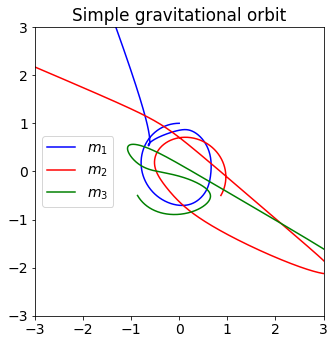

In [95]:
# Plotting time 
t_start = 0.
t_end = 100.
delta_t = 0.01

G = 1.
m_1 = 1.
m_2 = 1.
m_3 = 1.

#Instantiate a set of orbits
o1 = GravitationalOrbits(m_1, m_2, m_3, G)

# initial conditions with com velocity zero
x_1_0, x_dot_1_0 = 0., -1./1.5
y_1_0, y_dot_1_0 = 1., 0
x_2_0, x_dot_2_0 = np.sqrt(3)/2., 1./3.
y_2_0, y_dot_2_0 = -1./2.,np.sqrt(3)/3.
x_3_0, x_dot_3_0 = -(m_1 / m_3) * x_1_0 -(m_2 / m_3) * x_2_0 , -(m_1 / m_3) * x_dot_1_0 -(m_2 / m_3) * x_dot_2_0
y_3_0, y_dot_3_0 = -(m_1 / m_3) * y_1_0 -(m_2 / m_3) * y_2_0 , -(m_1 / m_3) * y_dot_1_0 -(m_2 / m_3) * y_dot_2_0

z_0 = [x_1_0, x_dot_1_0, y_1_0, y_dot_1_0, \
       x_2_0, x_dot_2_0, y_2_0, y_dot_2_0, \
       x_3_0, x_dot_3_0, y_3_0, y_dot_3_0]
x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2, x_3, x_dot_3, y_3, y_dot_3 = \
           o1.solve_ode(t_pts, z_0)

#start the plot!
fig = plt.figure(figsize=(5,5))

#first plot: orbit
ax = fig.add_subplot(1, 1, 1)

start, stop = start_stop_indices(t_pts, t_start, t_end)    
ax.plot(x_1, y_1, color='blue', label=r'$m_1$')
ax.plot(x_2, y_2, color='red', label=r'$m_2$')
ax.plot(x_3, y_3, color='green', label=r'$m_3$')
ax.set_title('Simple gravitational orbit')
ax.legend(loc='center left')
ax.set_aspect(1)

ax.set_xlim(-3, 3)
ax.set_ylim(-3, 3)

fig.tight_layout()
fig.savefig('simple_orbits.png', bbox_inches='tight')

Three objects start at three vertice of a triangle. These objects start with a relatively stable orbits. But then the objects getting too close, and thus their orbits become unstable and two masses are thrown far away by the effect of the gravity. The rest object also moving outward slowly. 

## Animation

In [96]:
from matplotlib import animation, rc
from IPython.display import HTML

In [97]:
%%capture
x_min = -2.2
x_max = -x_min
y_min = -2.2
y_max = -y_min

fig_anim = plt.figure(figsize=(5, 3), num='Double Orbit')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

# By assigning the first return from plot to pt1_anim and the others,
# we can later change the values.
ln1_anim, = ax_anim.plot(x_1, y_1, color='blue', lw=1)
ln2_anim, = ax_anim.plot(x_2, y_2, color='red', lw=1)
ln3_anim, = ax_anim.plot(x_3, y_3, color='green', lw=1)

pt1_anim, = ax_anim.plot(x_1[0], y_1[0], 'o', markersize=8, color='blue')
pt2_anim, = ax_anim.plot(x_2[0], y_2[0], 'o', markersize=8, color='red')
pt3_anim, = ax_anim.plot(x_3[0], y_3[0], 'o', markersize=8, color='green')

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig_anim.tight_layout()

In [98]:
def animate_orbits(i):
    """
    This is the function called by FuncAnimation to create each frame,
    numbered by i. So each i corresponds to a point in the t_pts
    array, with index i.
    """
    
    i_skip = 1 * i
    
    pt1_anim.set_data(x_1[i_skip], y_1[i_skip])
    pt2_anim.set_data(x_2[i_skip], y_2[i_skip])
    pt3_anim.set_data(x_3[i_skip], y_3[i_skip])
    
    return (pt1_anim, pt2_anim, pt3_anim) # this is needed for blit=True

In [99]:
frame_interval = 10. # time between frames
frame_number = 1001 # number of frames to include (index of t_pts)
anim =animation.FuncAnimation(fig_anim,
                              animate_orbits,
                              init_func=None,
                              frames=frame_number,
                              interval=frame_interval,
                              blit=True,
                              repeat=False)


In [100]:
HTML(anim.to_jshtml()) #animate

Three objects start at three vertice of a triangle. These objects start with a relatively stable orbits. But then the objects getting too close, and thus their orbits become unstable and two masses are thrown far away by the effect of the gravity. The rest object also moving outward slowly. 